### Theoretical methods of deep learning: Homework assignment 4
Submit solution by uploading to canvas, **by Friday, November 27th, 23:00**

**The task.** Consider the hierarchical broadcasting with the 2-state spin and the transition matrix 

$$M=(P(\sigma_1|\sigma_0))=\begin{pmatrix}
1-\epsilon & 0 \\
\epsilon & 1 \end{pmatrix}$$

(i.e., the first state changes with probability $\epsilon$ to second state, while the second state never changes).

1. How does the maximum likelihood reconstruction work for this model? (Give a simple explicit description.)
2. Assume that the branching number is $b$. Find theoretically for which pairs $(b,\epsilon)$ the reconstruction is solvable/unsolvable (give proofs).
3. For branching number $b=2$, find explicitely the survival probability of the first state (i.e., $P(\bigcap_{n\in\mathbb N}(\exists k:\pmb\sigma_n(k)=1)|\sigma_0=1)$, where $\pmb\sigma_n(k)$ denotes the $k$'th spin in the $n$'th layer), as a function of $\epsilon$.
3. Confirm the obtained theoretical phase diagram numerically.
4. Theoretically, is the reconstruction problem solvable or unsolvable at the critical values of $(b,\epsilon)$ (i.e., at the boundary of the solvable/unsolvable phases)? 

## The solutions are presented in the following order: 1 3 2 5 4

### 1

* Let's consider a single step of ML reconstruction at the final layer (a single batch of "sibling" nodes).
* If among this nodes there is at least one node in the first state, the probability of the parent node being in the second state is strictly zero (because there can be no transitions from the second state to the first state).
* Hence, if there is at least one node in the first state in the final layer, ML reconstruction probabilities for the root node will be $(1, \ 0)$ i.e. the root node is in the first state.
* If all the nodes in the final layer are in the second state, ML reconstruction will return greater probability for the root state being in the second state, because second state transitions to itself with probability $1$.
* Answer: first state if there is at least one node in the first state in the last layer, second state otherwise.

#### Let's implement this first

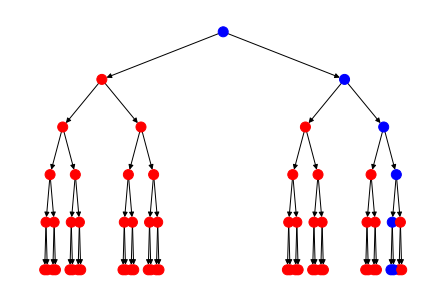

In [1]:
from __future__ import print_function 
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
%matplotlib inline

def makeRandFlips(spinA,  # input spins at a certain hierarchy level, as an array 
                  b,      # branching number
                  eps     # spin flip probability
                  ):
    shape1 = [b] + list(spinA.shape)
    spinA1 = np.empty(shape1, 'int')
    for a in range(b):
        surviveA = (np.random.rand(*list(spinA.shape)) < 1 - eps).astype(int)
        spinA1[a] = surviveA * spinA
        
    return spinA1    # spins at the next level

def runRandFlow(depth, 
                b,
                eps,
                root=1
               ): # run a full random hierarchical flow of spin flips
    spinA = np.array([root], 'int')
    spinAL = [spinA]

    for level in range(depth):
        spinAL.append(makeRandFlips(spinAL[-1], b, eps))
        
    return spinAL # the full flow as a list of arrays

def spinAL2tree(spinAL,
                plot=True,
                savefig=False
               ): # convert spin array list into a tree
    tree = nx.DiGraph()
    for level in range(len(spinAL)):
        for index, value in np.ndenumerate(spinAL[level]):
            node = tree.add_node(index)
            tree.nodes[index]['v'] = value
            if level > 0:
                predecessor = tuple(list(index)[1:])
                tree.add_edge(predecessor, index)
    
    # assign reasonable positions and colors for visualization
    pos = nx.spring_layout(tree)
    for level in range(len(spinAL)):  
        for index, value in np.ndenumerate(spinAL[level]):
            pos[index] = (np.sum([3.1**(l-level)*(index[l]-(spinAL[level].shape[l]-1.)/2)/(spinAL[level].shape[l]-1.+1e-8) 
                                  for l in range(level+1)]),
                         -level)  
    if plot:
        nx.draw(tree, pos, node_color=['r' if tree.nodes[node]['v'] == 0 else 'b' for node in tree.nodes], node_size=100)
        if savefig:
            plt.savefig('tree.pdf')
    return tree


def reconstruct(spinA, # final layer 
               ):
    
    if 1 in spinA:
        root = 1
    else:
        root = 0
        
    return root


spinAL = runRandFlow(depth=5, 
                     b=2,
                     eps=0.3,
                     root=1)

tree = spinAL2tree(spinAL)

### 3

* Solution is on the picture below

* __NOTE:__ There is a typo in the derivation of ML reconstruction, should be $(1 - \epsilon)$ instead of $(\epsilon - 1)$.

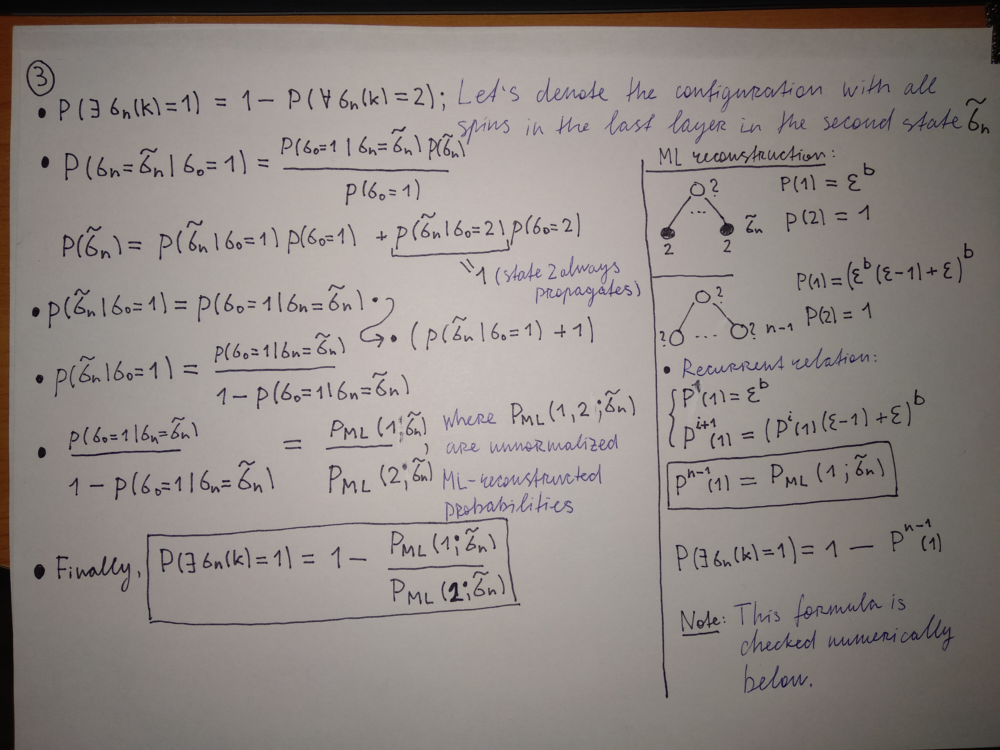

In [2]:
from IPython.display import Image
Image('3.jpg')

#### A small remark

* Let's write out the fixed point of this reccurrence in the case $b=2$.
* $P^{fix}(1) = (P^{fix}(1)(1 - \epsilon) + \epsilon)^2$
* $P^{fix}(1) = \frac{1 - 2\epsilon(1-\epsilon) \pm \sqrt{1-4\epsilon(1-\epsilon)}}{2(1-\epsilon)^2}$
* Visualization below shows that we have to select the minus root, because the plus root is always greater or equal to $1$.
* Answer: $P^{fix}(1) = \frac{1 - 2\epsilon(1-\epsilon) - \sqrt{1-4\epsilon(1-\epsilon)}}{2(1-\epsilon)^2}$.

In [3]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


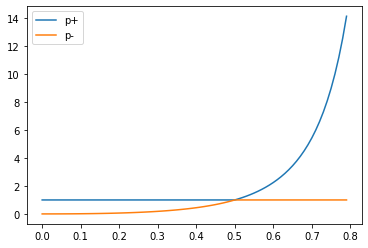

In [4]:
# plotting of two root braches p+ and p-
eps = np.arange(0, 0.8, 0.01)
p_plus = (1 - 2 * eps * (1 - eps) + np.sqrt(1 - 4 * eps * (1 - eps))) / (2 * np.power(1 - eps, 2))
p_minus = (1 - 2 * eps * (1 - eps) - np.sqrt(1 - 4 * eps * (1 - eps))) / (2 * np.power(1 - eps, 2))

plt.plot(eps, p_plus, label='p+')
plt.plot(eps, p_minus, label='p-')
plt.legend()

plt.show()

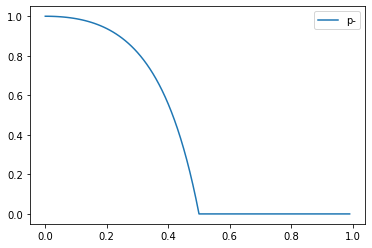

In [5]:
# we see that this formula yields the same result as the recurrent relation (see below)

eps = np.arange(0, 1, 0.01)
p_minus = (1 - 2 * eps * (1 - eps) - np.sqrt(1 - 4 * eps * (1 - eps))) / (2 * np.power(1 - eps, 2))

plt.plot(eps, 1 - p_minus, label='p-')
plt.legend()

plt.show()

### 2

* Unsolvability corresponds to a regime where the recurrent iteration has no nontrivial fixed points.
* Let's derive the conditions when this is the case.

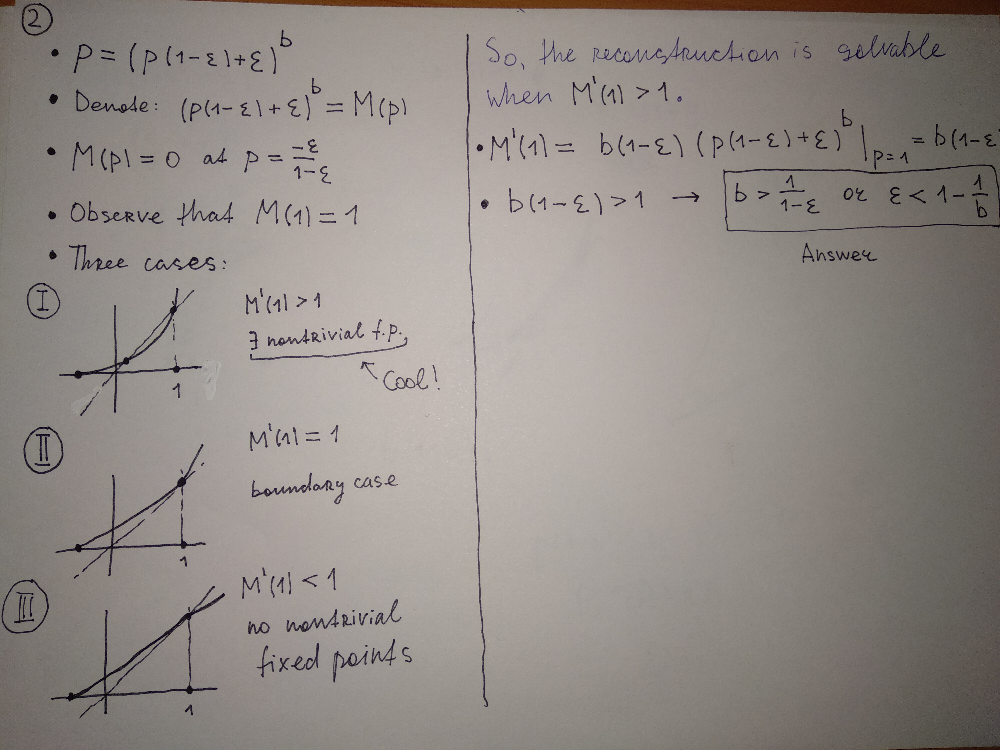

In [6]:
Image('2.jpg')

### 5

* From the points 2 and 3 it immediately follows that the reconstruction at the boundary is unsolvable. The fixed point of the iteration is at $1$, so the survival probability is $0$.

In [7]:
def compute_ps(eps, N, b=2):  # recurrent formula from the previous point
    ps = []
    p1 = eps ** 2
    
    for i in range(N):
        p1 = (p1 * (1 - eps) + eps) ** b

        
    return 1 - p1

### 4

In [8]:
def run_simulation(b, eps, Nruns=1000, depth=15):  # numerical estimation
    Ncorr = 0
    for i in range(Nruns):
        if reconstruct(runRandFlow(depth, b, eps)[-1]) == 1:
            Ncorr += 1
    
    return Ncorr / Nruns

critical eps: 0.5


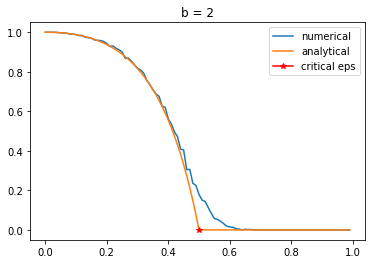

In [9]:
ps_analytical = []
ps_numerical = []
epss = np.arange(0, 1, 0.01)

B = 2

for eps in epss:
    ps_analytical.append(compute_ps(eps, 10000, b=B))
    ps_numerical.append(run_simulation(B, eps))

ceps = 1 - 1 / B

plt.plot(epss, ps_numerical, label='numerical')
plt.plot(epss, ps_analytical, label='analytical')
plt.plot([ceps], [0], marker='*', color='r', label='critical eps')
plt.legend()
plt.title('b = 2')
print(f'critical eps: {ceps}')    

critical eps: 0.8


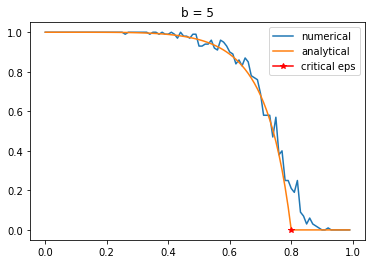

In [10]:
ps_analytical = []
ps_numerical = []
epss = np.arange(0, 1, 0.01)

B = 5

for eps in epss:
    ps_analytical.append(compute_ps(eps, 10000, b=B))
    ps_numerical.append(run_simulation(B, eps, Nruns=100, depth=7))
    
ceps = 1 - 1 / B

plt.plot(epss, ps_numerical, label='numerical')
plt.plot(epss, ps_analytical, label='analytical')
plt.plot([ceps], [0], marker='*', color='r', label='critical eps')
plt.legend()
plt.title('b = 5')
print(f'critical eps: {ceps}')

#### Let's try to obtain a beautiful picture

In [11]:
# estimation of the probability of reconstruction on a grid
EPS = np.arange(0, 1, 0.01)
B = np.arange(2, 20)

P_n = np.zeros((len(EPS), len(B)))

for i, eps in enumerate(EPS):
    for j, b in enumerate(B):
        depth = np.floor(np.log(200000) / np.log(b)).astype(int)
        P_n[i][j] = run_simulation(b, eps, Nruns=500, depth=depth)


In [12]:
# analytical phase boundary
eps_crit = []

for b in np.arange(2, 20):
    eps_crit.append(1 - 1. / b)
    
eps_crit = np.array(eps_crit)

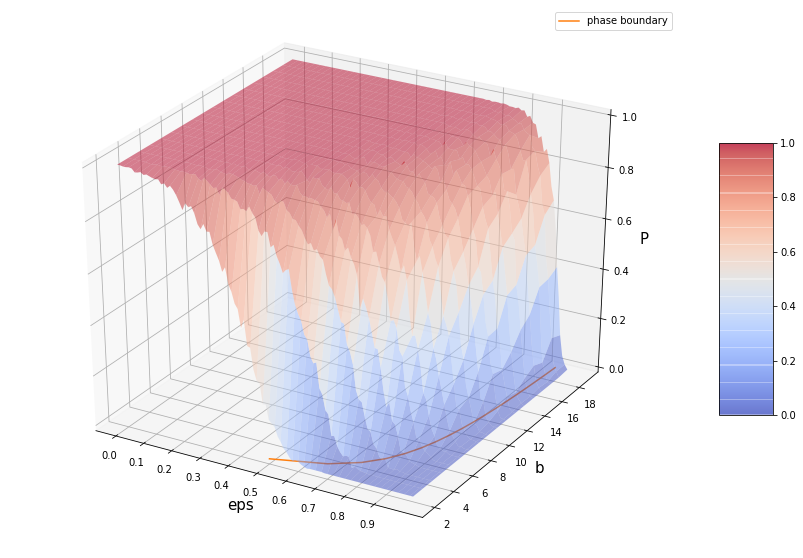

In [14]:
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D

EPS, B = np.meshgrid(EPS, B)

fig = plt.figure(figsize=(15, 10))
ax = fig.gca(projection='3d')

surf = ax.plot_surface(EPS, B, P_n.T, cmap=cm.coolwarm,
                       linewidth=0, antialiased=True, alpha=0.5)
ax.plot(eps_crit, np.arange(2, 20), label='phase boundary')

fig.colorbar(surf, shrink=0.5, aspect=5)

ax.set_xlabel('eps', fontsize=15)
ax.set_ylabel('b', fontsize=15)
ax.set_zlabel('P', fontsize=15)
ax.set_yticks(np.arange(2, 20, 2))
ax.set_xticks(np.arange(0, 1, 0.1))
plt.legend()

plt.show()

### Nice.
